In [1]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
import shap
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Activation
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.utils import image_dataset_from_directory
import os
from keras.utils import load_img, img_to_array
from matplotlib.lines import Line2D
from sklearn.cluster import KMeans

In [2]:
# Step 1: Load and preprocess the image dataset with higher resolution
data = image_dataset_from_directory(
    'flowers',
    image_size=(256, 256),
    batch_size=32
)

# Normalize images and prepare labels
images, labels = [], []
for image_batch, label_batch in data:
    images.append(image_batch.numpy())
    labels.append(label_batch.numpy())

images = np.concatenate(images) / 255.0
labels = np.concatenate(labels)

# Filter to include only 'rose' and 'sunflower' classes
mask = labels < 2
images, labels = images[mask], labels[mask]


Found 1517 files belonging to 2 classes.


In [3]:
# Step 2: Train a CNN model to output only 2 classes (rose, sunflower)
inputs = Input(shape=(256, 256, 3), name="Input")
x = Conv2D(32, 3, activation="relu", padding='same', name='Conv1')(inputs)
x = MaxPooling2D(2, name='Pool1')(x)
x = Conv2D(16, 3, activation="relu", padding='same', name='Conv2')(x)
x = MaxPooling2D(2, name='Pool2')(x)
x = Flatten(name='Vectorize')(x)
x = Dense(128, activation="relu", name="Dense1")(x)  # Embedding layer
x = Dense(2, name='FC')(x)  # Output only 2 classes now
outputs = Activation("softmax", name='Softmax')(x)

# Compile the CNN model
cnn_model = Model(inputs, outputs)
cnn_model.compile(optimizer=Adam(learning_rate=0.001), loss=CategoricalCrossentropy(), metrics=['acc'])

# Train the CNN
X_train, X_test, y_train, y_test = train_test_split(images, labels, stratify=labels, test_size=0.2, random_state=11)
cnn_model.fit(
    X_train,
    to_categorical(y_train, num_classes=2),
    validation_split=0.15,
    batch_size=32,
    epochs=5  # Keep epochs low for quicker training
)

Epoch 1/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 15s 384ms/step - acc: 0.6088 - loss: 2.5420 - val_acc: 0.8352 - val_loss: 0.4309
Epoch 2/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 13s 388ms/step - acc: 0.8862 - loss: 0.2730 - val_acc: 0.8736 - val_loss: 0.3518
Epoch 3/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 13s 387ms/step - acc: 0.9283 - loss: 0.2034 - val_acc: 0.8516 - val_loss: 0.3488
Epoch 4/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 13s 384ms/step - acc: 0.9403 - loss: 0.1755 - val_acc: 0.8681 - val_loss: 0.3088
Epoch 5/5
33/33 ━━━━━━━━━━━━━━━━━━━━ 13s 404ms/step - acc: 0.9661 - loss: 0.1072 - val_acc: 0.8571 - val_loss: 0.3641


In [4]:
#Extract embeddings from the CNN
def extract_embeddings(cnn_model, images):
    feature_extractor = Model(inputs=cnn_model.input, outputs=cnn_model.get_layer("Dense1").output)
    return feature_extractor.predict(images)

X_train_embed = extract_embeddings(cnn_model, X_train)
X_test_embed = extract_embeddings(cnn_model, X_test)

# Train an XGBoost classifier on the embeddings
xgb_model = XGBClassifier(eval_metric='mlogloss', random_state=42)
xgb_model.fit(X_train_embed, y_train)

38/38 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=42, ...)

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:47, 47.15s/it]               


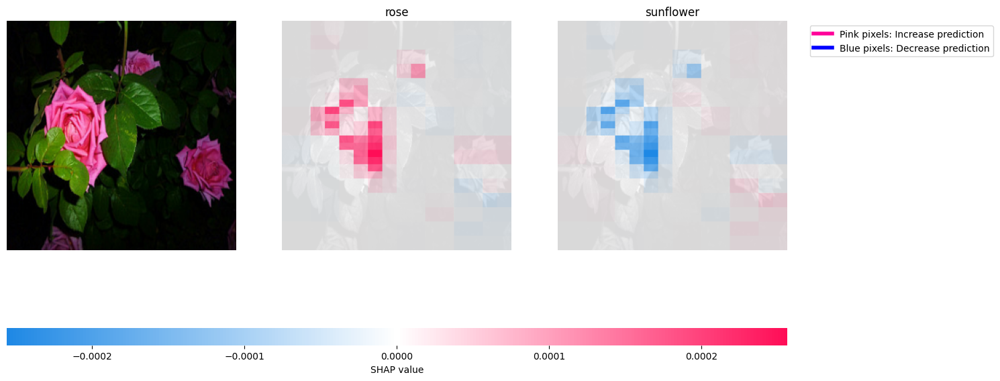

In [5]:
# SHAP Explainer
explainer = shap.Explainer(xgb_model)
shap_values = explainer(X_test_embed)

# SHAP Image Masker
def f(x):
    tmp = x.copy()
    return cnn_model(tmp)

masker_blur = shap.maskers.Image("blur(256,256)", X_test[0].shape)
explainer = shap.Explainer(f, masker_blur, output_names=['rose', 'sunflower'])

ind = [120]

shap_values_ = explainer(X_test[ind], max_evals=5000, batch_size=50)
# Plot SHAP values with custom legends
shap.image_plot(shap_values_, X_test[ind], labels=['rose', 'sunflower'], show=False)

legend_elements = [
    Line2D([0], [0], color='#FF0099', lw=4, label='Pink pixels: Increase prediction'),
    Line2D([0], [0], color='blue', lw=4, label='Blue pixels: Decrease prediction')
]
plt.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(1.5, 1))
plt.gcf().set_size_inches(15, 10)
plt.show()

c:\Users\pc\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\pc\AppData\Local\Programs\Python\Python311\Lib\site-packages\joblib\externals\loky\backend\context.py:150: UserWarning: Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "c:\Users\pc\AppData\Local\Programs\Python\Python311\Lib\site-packages\joblib\externals\loky\backend\context.py", line 245, in _count_physical_cores
    raise ValueError(
c:\Users\pc\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default v

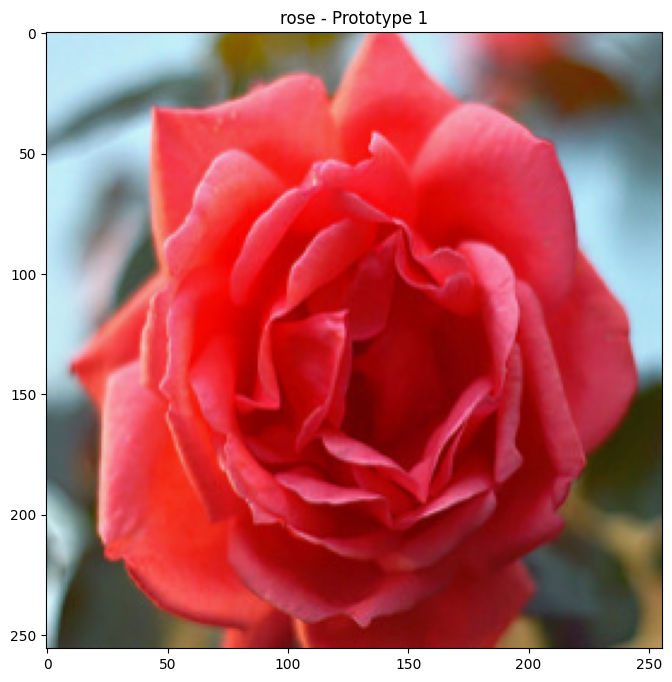

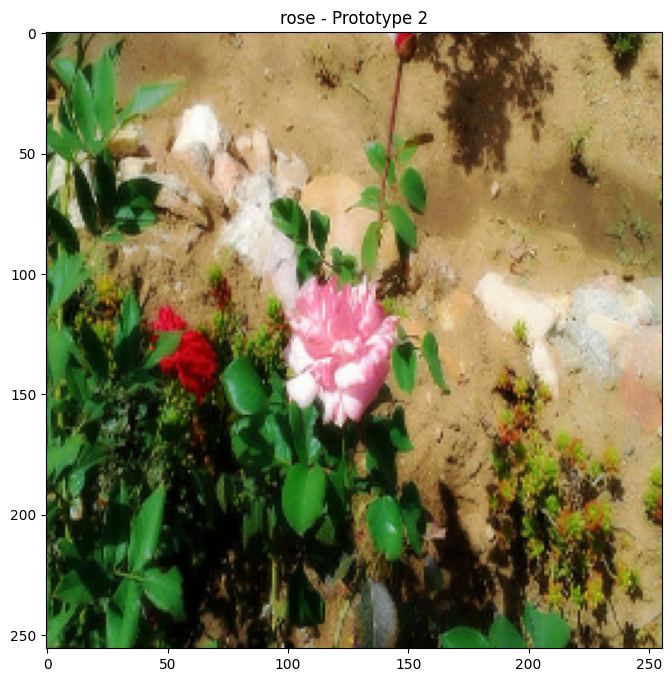

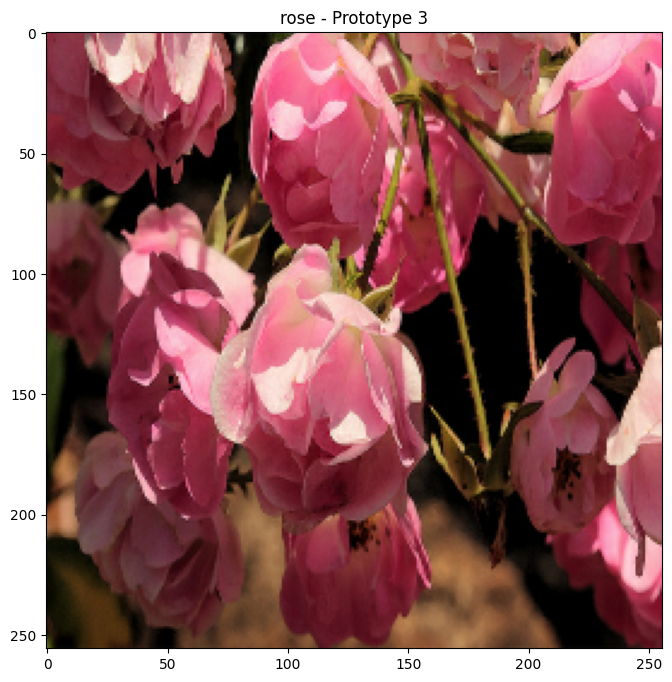

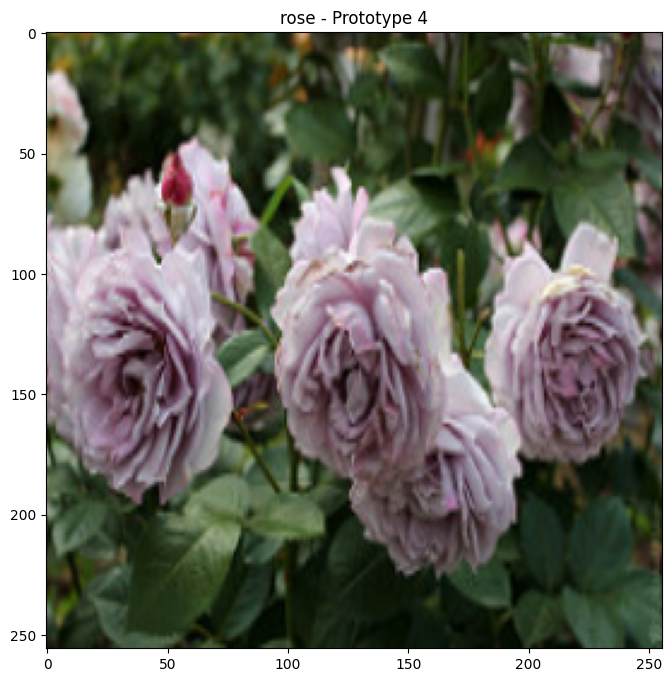

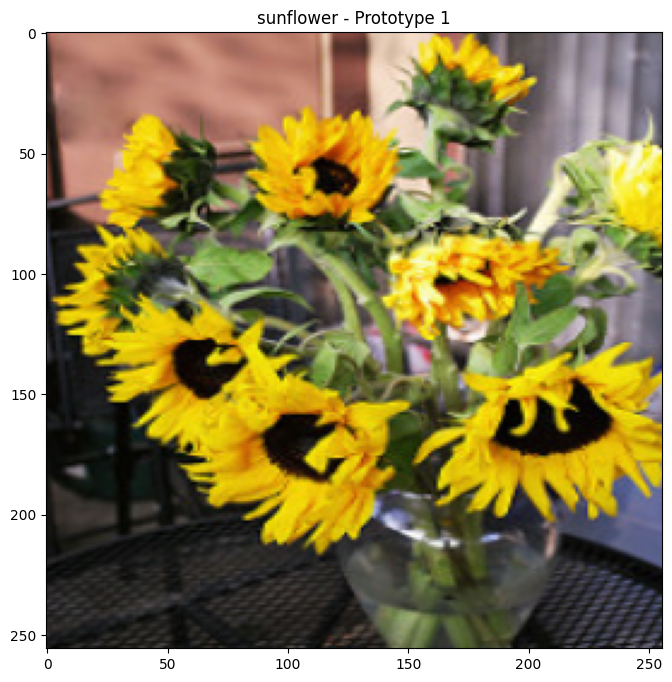

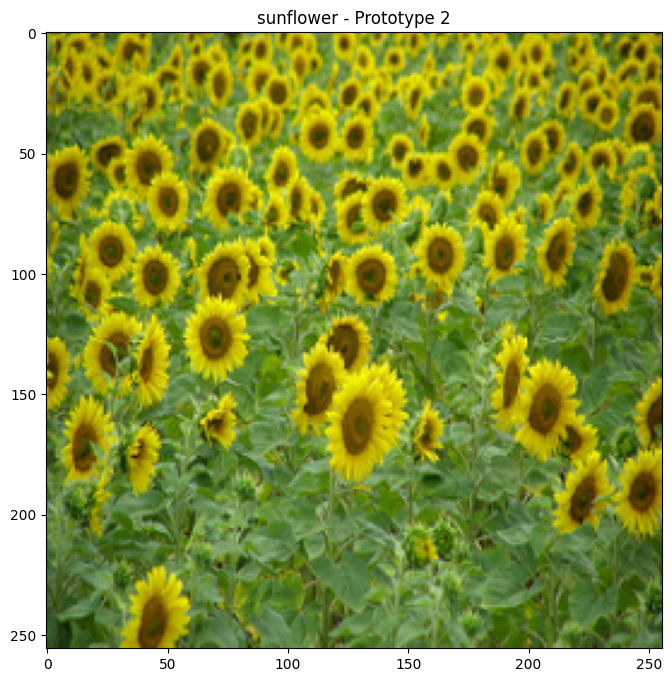

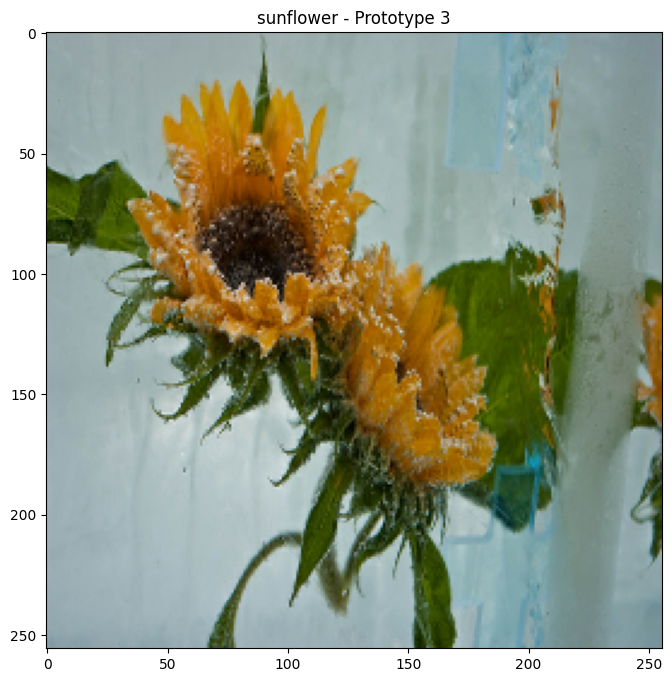

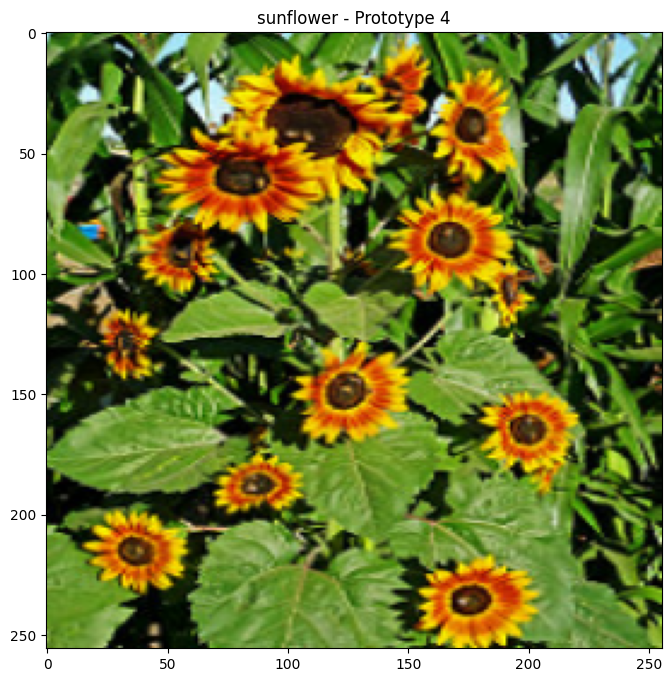

In [6]:
# Prototypes with K-means Clustering
def find_prototypes_with_kmeans(X_train_embed, y_train, n_prototypes=4):
    prototypes = []
    for class_label in np.unique(y_train):
        class_indices = np.where(y_train == class_label)[0]
        class_embeddings = X_train_embed[class_indices]
        
        kmeans = KMeans(n_clusters=n_prototypes, random_state=42).fit(class_embeddings)
        centroids = kmeans.cluster_centers_
        prototypes.append(centroids)
    
    return prototypes

prototypes = find_prototypes_with_kmeans(X_train_embed, y_train, n_prototypes=4)

# Visualize prototypes
def visualize_prototypes(prototypes, X_test_embed, y_test, prototype_type='best'):
    for class_label, proto_centroids in enumerate(prototypes):
        for i, proto in enumerate(proto_centroids):
            distances = np.linalg.norm(X_test_embed - proto, axis=1)
            prototype_image_index = np.argmin(distances)
            
            plt.figure(figsize=(8, 8))
            plt.imshow(X_test[prototype_image_index])
            plt.title(f"{['rose', 'sunflower'][class_label]} - Prototype {i + 1}")
            plt.show()

visualize_prototypes(prototypes, X_test_embed, y_test, prototype_type='best')


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:43, 43.89s/it]               


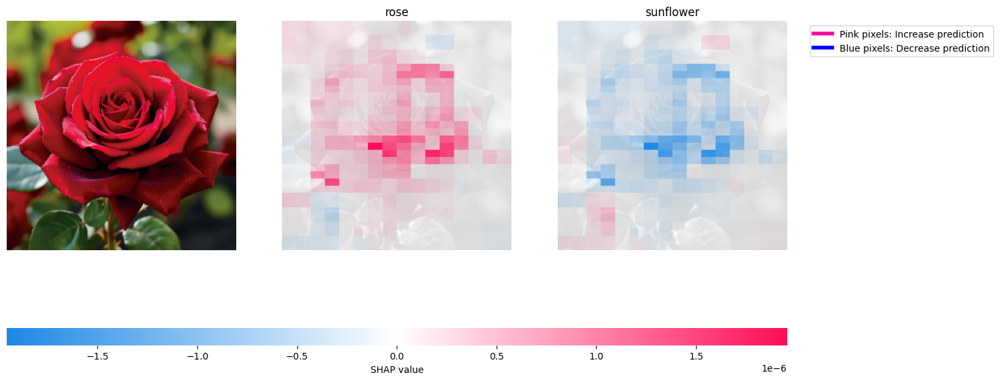

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:44, 44.56s/it]               


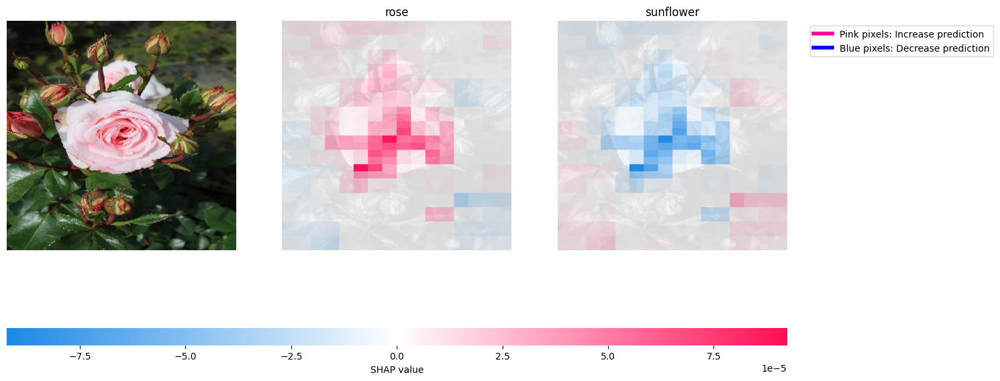

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:45, 45.10s/it]               


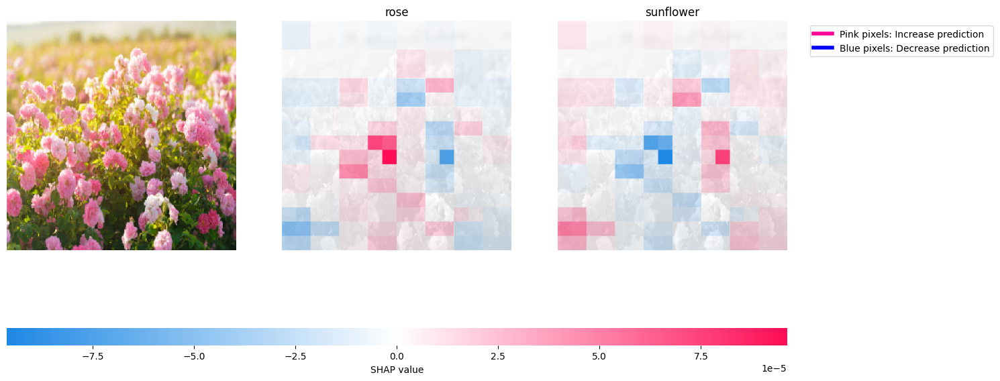

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:43, 43.50s/it]               


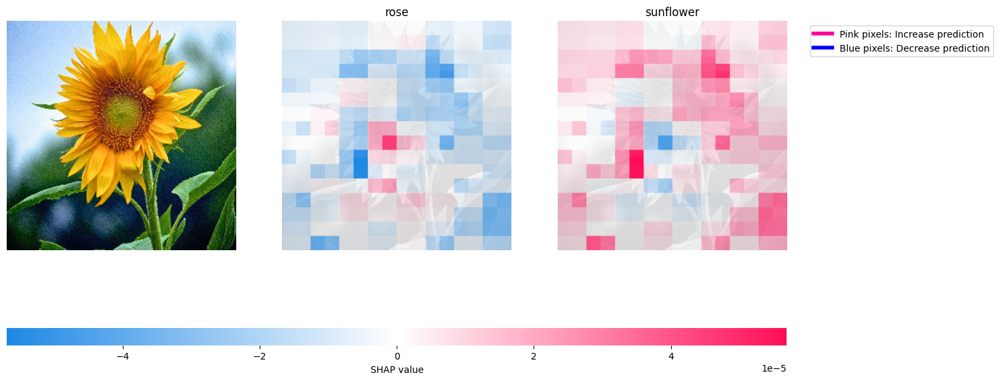

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:44, 44.77s/it]               


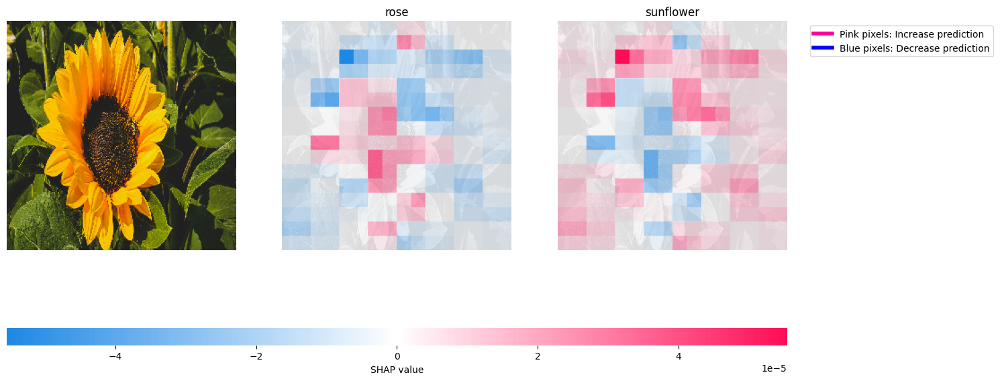

  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:45, 45.48s/it]               


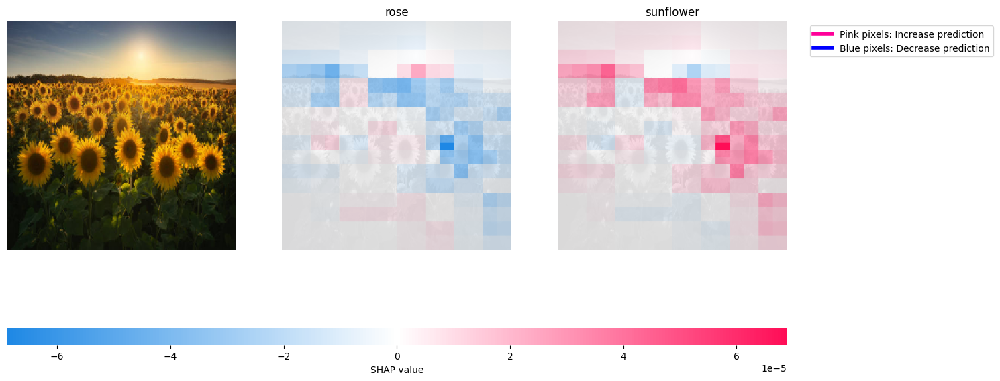

In [7]:
# Try SHAP and Prototypes with Additional Images
additional_images = []
for filename in os.listdir('test_images'):
    img = load_img(os.path.join('test_images', filename), target_size=(256, 256))
    img = img_to_array(img) / 255.0
    additional_images.append(img)

additional_images = np.array(additional_images)
additional_embeddings = extract_embeddings(cnn_model, additional_images)
additional_predictions = xgb_model.predict(additional_embeddings)

for i, image in enumerate(additional_images):
    shap_values_ = explainer(image[np.newaxis, ...], max_evals=5000, batch_size=50)
    shap.image_plot(shap_values_, image[np.newaxis, ...], labels=['rose', 'sunflower'], show=False)

    legend_elements = [
        Line2D([0], [0], color='#FF0099', lw=4, label='Pink pixels: Increase prediction'),
        Line2D([0], [0], color='blue', lw=4, label='Blue pixels: Decrease prediction')
    ]

    plt.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(1.5, 1))
    plt.gcf().set_size_inches(15, 10)
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


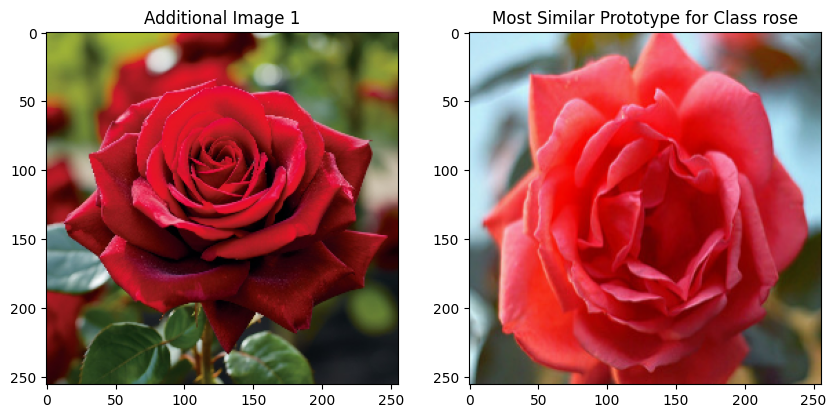

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


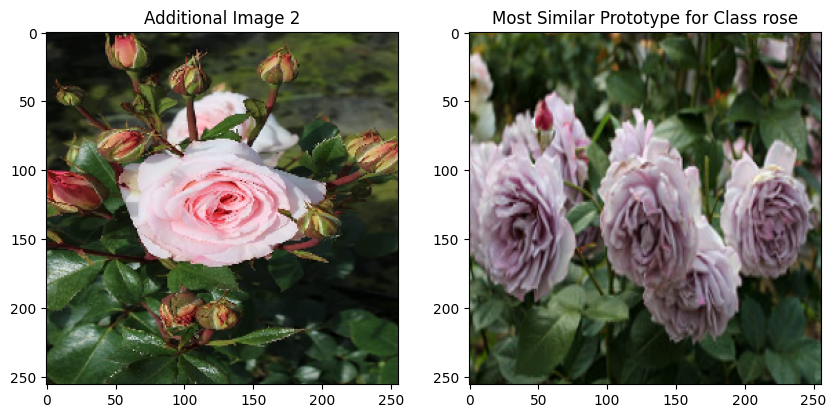

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


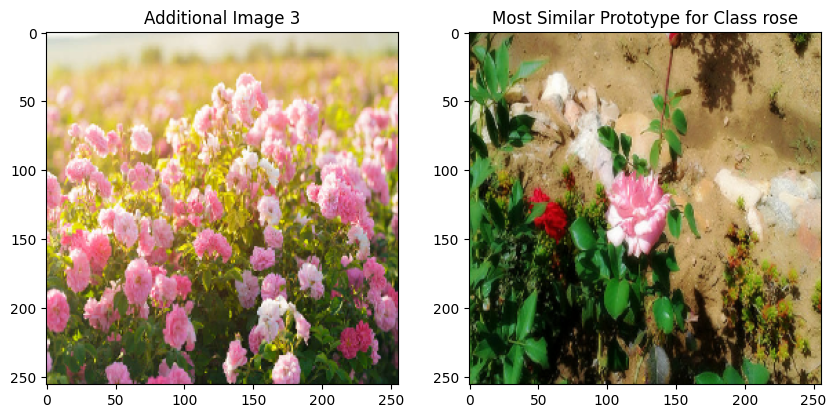

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


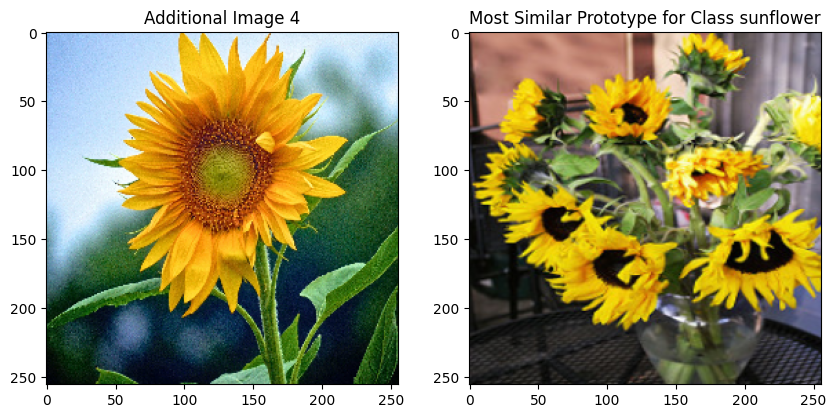

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


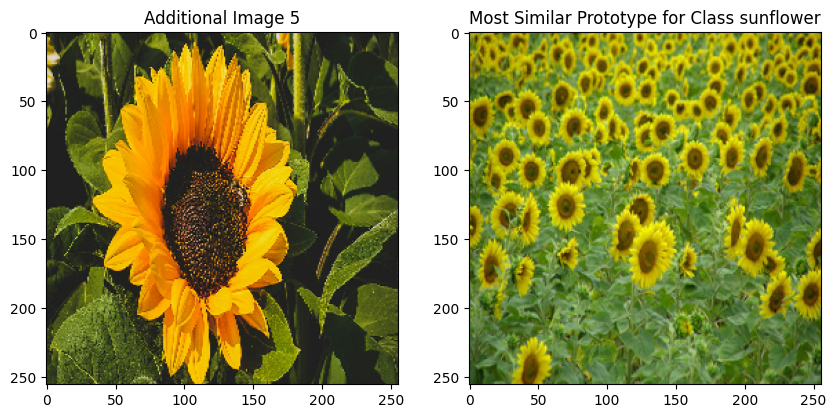

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


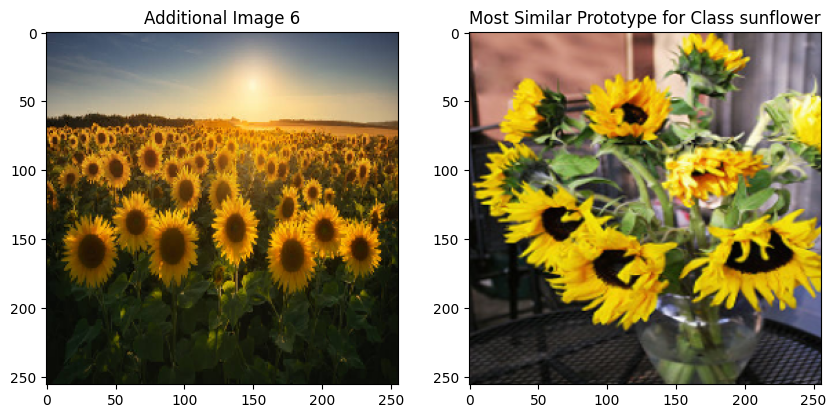

In [8]:
def match_prototypes(extra_embed, prototypes):
    min_distance = float('inf')
    closest_prototype = None
    for class_prototypes in prototypes:
        for proto in class_prototypes:
            distance = np.linalg.norm(extra_embed - proto)
            if distance < min_distance:
                min_distance = distance
                closest_prototype = proto
    return closest_prototype

for i, image in enumerate(additional_images):
    most_similar_prototype = match_prototypes(additional_embeddings[i], prototypes)

    predicted_class = np.argmax(cnn_model.predict(image[np.newaxis, ...]))
    class_name = ['rose', 'sunflower'][predicted_class]

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title(f"Additional Image {i + 1}")
    plt.subplot(1, 2, 2)
    plt.imshow(X_test[np.argmin(np.linalg.norm(X_test_embed - most_similar_prototype, axis=1))])
    plt.title(f"Most Similar Prototype for Class {class_name}")
    plt.show()